# PHYS 325 Scientific Computing -- Fall 2018

## 2.3 Data analysis

### 2.3.3 Statistical description of data

Descriptive statistics (model-independent) => characterize a data set in general terms: 

- mean,
- variance,
- correlation between data sets, etc.

$N$ data points: $x_1,\ldots,x_N$ 

=> *sample* of data; contains random noise (for now assume uncorrelated data points)

Underlying distribution $P(x)$ *which we don't know*!

Properties of the exact distribution:

- Normalization

  $$1 = \int_{-\infty}^\infty P(x) \, d x$$
  
- Moments:

  $$\langle x^n\rangle=\int_{-\infty}^\infty x^nP(x) \, d x$$
  
- From the moments we get:

  $$
  \begin{align}
  \mu &\equiv \langle x \rangle \\
  \sigma^2 &\equiv \langle \, \left(x - \langle x\rangle\right)^2 \,
  \rangle = \langle x^2 \rangle - \langle x \rangle^2\,
  \end{align}
  $$
  
  => mean and variance (which is the "standard deviation" squared)

We want to estimate the mean of the **exact distribution** from our **sampled data** and quantify our **uncertainty** of this estimate

- Sample mean

  $$\overline{x}=\frac{1}{N}\sum_{i=1}^Nx_i$$

     - estimates the value around which central clustering occurs
     - not always the best estimator => median

- Sample variance ("width" or "variability" around central value)

  $$
  s^2 =  {1 \over N-1} \sum_{i=1}^N \left( x_i -\overline{x}\right)^2 \, .
  $$

It is important to distinguish between the **exact distribution** and the **sampled distribution**!

As $N\rightarrow\infty$ the sampled distribution approaches the exact distribution.

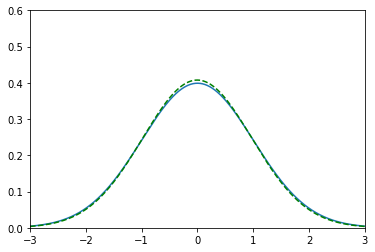

In [51]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# exact distribution, used to generate data
def gaussian(x, mu, sig):
    return np.exp(-(x - mu)*(x - mu)/(2*sig*sig))/np.sqrt(2*np.pi)/sig

mu_exact = 0
sig_exact = 1

randomdata = []

fig = plt.figure()
plt.xlim(-3, 3)
plt.ylim(0, 0.6)
plt.xlabel('x')

x = np.linspace(-3, 3, 1000)
plt.plot(x, gaussian(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata
    randomdata = np.append(randomdata, np.random.normal(mu_exact, sig_exact, 10))
    #randomdata = np.random.normal(mu_exact, sig_exact, 10)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    if i > 0:
        plt.cla()
        plt.xlim(-3, 3)
        plt.ylim(0, 0.6)
        plt.plot(x, gaussian(x, mu_exact, sig_exact))
        plt.plot(x, gaussian(x, mean_data, sig_data), 'g--')
        #plt.hist(randomdata, bins = (i + 100)//5, density = True)
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

Thought experiment:

   - suppose we could repeat the set of $N$ measurements many many times
   - each time we get a value of the sample average $\overline{x}$. 
   - construct a distribution, $\widetilde{P}(\overline{x})$ from these
   - enough repetitions => effectively averaging over the exact distribution

   $$
   \langle \overline{x} \rangle = {1 \over N} \sum_{i=1}^N \langle x_i \rangle =
   \langle x \rangle  \equiv \mu \, ,
   $$

   $$
   \boxed{ \mbox{the best estimate of } \mu \mbox{ is }\overline{x}}
   $$

   An estimate like this, which gives the exact result if averaged over many repetitions of the experiment, is said to be **unbiased**.

   - Uncertainty, or "error bar" on our estimate $\overline{x}$ for the exact average $\mu$:

     $$
     \sigma_{\overline{x}}^2 \equiv \langle \overline{x}^2 \rangle- \langle \overline{x} \rangle^2 = {\sigma^2 \over N}\, ,
     $$

     The problem is that we don't know $\sigma^2$... but we do know $s^2$ !

     averaging $s^2$ over many repetitions of $N$ data points gives $\sigma^2$ => unbiased estimate

   - Standard error of the mean: 

    $$
    \boxed{\mbox{the best estimate of } \sigma_{\overline{x}}^2 \mbox{ is }{s^2  \over N}}
    $$

Altogether:

$$
\mu = \overline{x}\; \pm \; \sigma_{\overline{x}} \, ,
$$

where

$$
\sigma_{\overline{x}} = \left[
{1 \over N(N-1)} \, \sum_{i=1}^N (x_i -  \overline{x})^2 \right]^{1/2} \, .
$$

=> the error bar in the mean goes down like $1/\sqrt{N}$ for large $N$ !

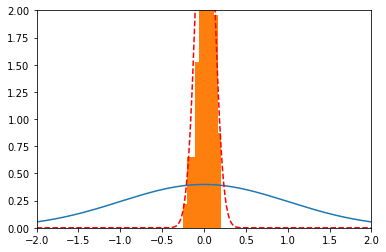

In [50]:
randomdata = []
distr_means = []
num_samples = 100

fig = plt.figure()
plt.xlim(-2, 2)
plt.ylim(0, 2)

x = np.linspace(-2, 2, 500)
plt.plot(x, gaussian(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata, distr_means
    randomdata = np.random.normal(mu_exact, sig_exact, num_samples)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    distr_means = np.append(distr_means, mean_data)
    
    if i > 0:
        plt.cla()
        plt.xlim(-2, 2)
        plt.ylim(0, 2)
        plt.plot(x, gaussian(x, mu_exact, sig_exact))
        if i > 10:
            plt.hist(distr_means, density = True)
            plt.plot(x, gaussian(x, np.mean(distr_means), sig_data/np.sqrt(num_samples)), 'r--')
            #plt.plot(x, gaussian(x, np.mean(distr_means), np.sqrt(np.var(distr_means))), 'g--')
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

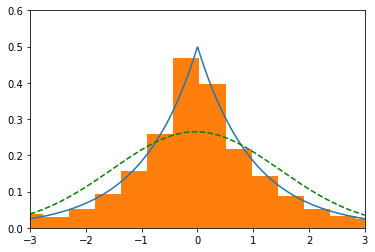

In [53]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# exact distribution, used to generate data
def laplace(x, mu, sig):
    return np.exp(-abs(x-mu)/sig)/(2.*sig)

mu_exact = 0
sig_exact = 1

randomdata = []

fig = plt.figure()
plt.xlim(-3, 3)
plt.ylim(0, 0.6)

x = np.linspace(-3, 3, 1000)
plt.plot(x, laplace(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata
    randomdata = np.append(randomdata, np.random.laplace(mu_exact, sig_exact, 10))
    #randomdata = np.random.normal(mu_exact, sig_exact, 10)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    if i > 0:
        plt.cla()
        plt.xlim(-3, 3)
        plt.ylim(0, 0.6)
        plt.plot(x, laplace(x, mu_exact, sig_exact))
        plt.plot(x, gaussian(x, mean_data, sig_data), 'g--')
        plt.hist(randomdata, bins = (i + 100)//5, density = True)
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

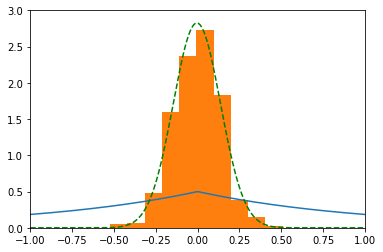

In [75]:
randomdata = []
distr_means = []
num_samples = 100

fig = plt.figure()
plt.xlim(-1, 1)
plt.ylim(0, 3)

x = np.linspace(-1, 1, 200)
plt.plot(x, laplace(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata, distr_means
    randomdata = np.random.laplace(mu_exact, sig_exact, num_samples)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    distr_means = np.append(distr_means, mean_data)
    
    if i > 0:
        plt.cla()
        plt.xlim(-1, 1)
        plt.ylim(0, 3)
        plt.plot(x, laplace(x, mu_exact, sig_exact))
        if i > 10:
            plt.hist(distr_means, bins = 20, density = True)
            plt.plot(x, gaussian(x, np.mean(distr_means), np.sqrt(np.var(distr_means))), 'g--')
    
simulation = animation.FuncAnimation(fig, animate, frames = 400, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

What does this error bar mean in terms of probabilities?

Central limit theorem for large $N$: the distribution of $\overline{x}$ is a Gaussian. 

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/8c/Standard_deviation_diagram.svg/640px-Standard_deviation_diagram.svg.png" alt="Gaussian" style="width: 400px;"/>
Image: Wikipedia

In reality: outliers are much more common!

**Several random variables**

**sample covariance** of $x$ and $y$ defined as

$$
s_{xy}^2 \equiv  {1 \over N-1 } \sum_{i=1}^N
\left( x_i - \overline{x}\right) \, \left(y_i - \overline{y}\right)\, .
$$

Closely related to **correlation**

linear correlation coefficient (also called Pearson's $r$):

$$r = \frac{\sum_{i=1}^N
\left( x_i - \overline{x}\right) \, \left(y_i - \overline{y}\right)}{\sqrt{\sum_{i=1}^N
\left( x_i - \overline{x}\right)^2} \, \sqrt{\sum_{i=1}^N\left(y_i - \overline{y}\right)^2}}$$

- $r$ lies between -1 and 1
- $r=1$: complete positive correlation
- $r=-1$: complete negative correlation
- $r=0$: uncorrelated data
- value of $r$ often used to characterize the strength of (significant) correlations

**Correlation $\neq$ causation**

- correlation: knowing the value of one variable gives information about the likely value of the other
- causation: one state influences the other via a cause-and-effect process

<center><b> Are Two Distributions Different?</b>
    <br>
or
<br>
<b> Are two data sets drawn from the same distribution function, or from different distribution functions?</b>
<br>
or
<br>
<b> Can we disprove, to a certain required level of significance, the null hypothesis that two data sets are drawn from the same population distribution function?</b>
    <br>
</center>
    
- Disproving the null hypothesis shows that the data sets are from different distributions. 
- Failing to disprove the null hypothesis only shows that the data sets can be *consistent* with a single distribution function.
- One can never prove that two data sets come from a single distribution (no amount of data can distinguish between distributions which differ only very slightly)

Cases:

- continuous data / binned data
- comparing to known distribution / comparing to equally unknown data sets

Example questions:

- Are the visible stars distributed uniformly in the sky? 
- Are educational patterns the same in Brooklyn as in the Bronx? 
- Do two brands of fluorescent lights have the same distribution of burn-out times? 
- Is the incidence of chicken pox the same for first-born, second-born, third-born children, etc.?

The accepted test for differences between binned distributions is the chi-square test:

$$\chi^2 = \sum_i\frac{(N_i-n_i)^2}{n_i}$$

- $N_i$: number of observed values in bin $i$
- $n_i$: number of expected values in bin $i$

large values of $\chi^2$ indicate an unlikely null hypothesis

### 2.3.4 Data fitting

Model-dependent statistics: fitting a smooth function through data

- set of $N$ data points with error bars: $(x_i,y_i,\sigma_i)$
- choice of fitting function
     - linear
     - higher order polynomial
     - exponential or power law
     - more complicated function
- fitting function depends on $M$ fit parameters, e.g. polynomial coefficients
- we want the "best fit", or best values of these parameters
- we also want error estimates on the parameters
- and a measure of how good our fit is!

Bad fit => fit parameters and errors are meaningless!

#### Least squares

Minimize

$$
\chi^2 = \sum_{i=1}^N \left( \, {y_i - f(x_i) \over \sigma_i } \, \right)^2,
$$

where $f(x)$ is the fitting function

Why do we minimize this expression?

- fitting function should closely resemble the data
- how can we quantify this?

> It is not meaningful to ask the question, "What is the probability that a particular set of fitted parameters is correct?" The reason is that there is no statistical universe of models from which the parameters are drawn. There is just one model, the correct one, and a statistical universe of data sets that are drawn from it!

<div style="text-align: right">Quote from: <i>"Numerical Recipes in C"</i></div>

=> Turn this question around:

> Given a particular set of parameters, what is the probability that this data set could have occurred?

- our data set should not be too improbable for the correct choice of fit parameters

  => calculate probability of data given some parameters
  
  => take this as the *likelihood* of the parameters given the data
  <br>
  
- this identification is based on our *intuition* not strict maths
- then: mathematical **maximum likelihood estimation**

Assumptions:

- each data point $y_i$ has a measurement error that is independently random...
- ...and distributed as a normal (Gaussian) distribution around the "true" model $y(x)$

- then the probability of the data set is the product of the probabilities of each point
- maximizing this probability is equivalent to minimizing

$$
\chi^2 = \sum_{i=1}^N \left( \, {y_i - f(x_i) \over \sigma_i } \, \right)^2,
$$

- the function $f(x)$ can be anything we like

But which $\chi^2$ values are "good enough"?